# MNIST classification

## importing libraries

In [1]:
import pandas as pd
import numpy as np

# importing data

In [2]:
data1 = pd.read_csv("/home/karthik/data_sets/mnist-dataset/mnist_train.csv").values
data1
data2 = pd.read_csv("/home/karthik/data_sets/mnist-dataset/mnist_test.csv").values
data2

array([[2, 0, 0, ..., 0, 0, 0],
       [1, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [4, 0, 0, ..., 0, 0, 0],
       [5, 0, 0, ..., 0, 0, 0],
       [6, 0, 0, ..., 0, 0, 0]])

In [3]:
import matplotlib.pyplot as plt

In [4]:
from sklearn.tree import DecisionTreeClassifier
clf=DecisionTreeClassifier()

In [5]:
xtrain = data1[0: , 1:]
train_label = data1[0: , 0]
print(train_label)

[0 4 1 ... 5 6 8]


In [6]:
xtest = data2[0: , 1:]
test_label = data2[0: , 0]
print(test_label)

[2 1 0 ... 4 5 6]


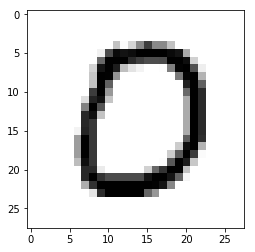

In [7]:
d=xtest[9]
d.shape=(28,28)
plt.imshow(255-d,cmap='gray')

In [8]:
clf.fit(xtrain,train_label)
print(clf.predict([xtest[0]]))
test_label[0]

[2]


2

In [9]:
output = clf.predict(xtest)
output

array([2, 1, 0, ..., 4, 5, 6])

In [10]:
output_train = clf.predict(xtrain)
output_train

array([0, 4, 1, ..., 5, 6, 8])

In [11]:
count = 0
for i in range(0,9999):
    count+=1 if output[i] == test_label[i] else 0
    
count
print("accuracy=", (count/9999)*100)

accuracy= 88.0888088808881


In [12]:
count1 = 0
for i in range(0,9999):
    count1+=1 if output_train[i] == train_label[i] else 0

In [13]:
count1

9999

In [14]:
print("accuracy=", (count1/9999)*100)

accuracy= 100.0


In [15]:
import graphviz
from sklearn import tree
dot_data = tree.export_graphviz(clf, out_file=None,  
                         filled=True, rounded=True,  
                         special_characters=True)   
graph = graphviz.Source(dot_data) 
graph

In [16]:
graph.render("mnist")

'mnist.pdf'

In [17]:
from sklearn.ensemble import RandomForestClassifier
rfc = RandomForestClassifier(n_estimators=600)
rfc.fit(xtrain,train_label)
pred = rfc.predict(xtest)
pred

array([2, 1, 0, ..., 4, 5, 6])

In [18]:
count2 = 0
for i in range(0,9999):
    count2+=1 if pred[i] == test_label[i] else 0
count2
print("accuracy=", (count2/9999)*100)

accuracy= 97.1097109710971


In [19]:
from sklearn.metrics import classification_report,confusion_matrix

In [20]:
print(classification_report(output,test_label))

             precision    recall  f1-score   support

          0       0.94      0.91      0.92      1005
          1       0.96      0.96      0.96      1133
          2       0.86      0.87      0.86      1023
          3       0.86      0.84      0.85      1031
          4       0.88      0.88      0.88       975
          5       0.84      0.84      0.84       894
          6       0.89      0.90      0.89       942
          7       0.91      0.91      0.91      1023
          8       0.82      0.83      0.82       964
          9       0.85      0.85      0.85      1009

avg / total       0.88      0.88      0.88      9999



In [21]:
print(confusion_matrix(output,test_label))

[[ 918    0   15    5    7   13   15    3   11   18]
 [   0 1088    6    5    2    5    3   11    7    6]
 [   5    9  888   30    9    3   14   26   31    8]
 [   4    7   28  867    7   42    8   13   37   18]
 [   7    1    8    5  862    9   16    7   15   45]
 [  13    7   17   43    6  752   22    5   20    9]
 [  10    9   11    3   15   23  848    4   15    4]
 [   3    4   27   10   11    4    3  930   12   19]
 [  11    8   23   23   24   24   23    9  796   23]
 [   9    2    9   19   39   17    6   19   30  859]]


# naive bayes method

In [22]:
from sklearn.naive_bayes import GaussianNB
gnb = GaussianNB()
gnb.fit(xtrain,train_label)
out = gnb.predict(xtest)
out

array([2, 1, 0, ..., 9, 8, 6])

In [23]:
count3 = 0
for i in range(0,9999):
    count3+=1 if out[i] == test_label[i] else 0

In [24]:
count3
print("accuracy=", (count3/9999)*100)

accuracy= 55.585558555855584


In [25]:
clf_entropy = DecisionTreeClassifier( criterion = "entropy")
clf.fit(xtrain,train_label)
out1 = clf.predict(xtest)

In [26]:
count4 = 0
for i in range(0,9999):
    count4+=1 if out1[i] == test_label[i] else 0

In [27]:
count4

8751

In [28]:
data2

array([[2, 0, 0, ..., 0, 0, 0],
       [1, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [4, 0, 0, ..., 0, 0, 0],
       [5, 0, 0, ..., 0, 0, 0],
       [6, 0, 0, ..., 0, 0, 0]])

In [29]:
from sklearn.metrics import roc_curve, auc


In [30]:
from sklearn.preprocessing import label_binarize


In [31]:
from scipy import interp


In [32]:
train_label1 = train_label
train_label1 = label_binarize(train_label, classes=[0, 1, 2,3,4,5,6,7,8,9])


In [33]:
train_label1

array([[1, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 1, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 1, 0]])

In [34]:
print(train_label1)

[[1 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 1 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 1 0]]


In [35]:
test_label1 = test_label
test_label1 = label_binarize(test_label, classes=[0, 1, 2,3,4,5,6,7,8,9])
n_classes=test_label1.shape[1]

In [36]:
test_label1

array([[0, 0, 1, ..., 0, 0, 0],
       [0, 1, 0, ..., 0, 0, 0],
       [1, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]])

In [37]:
clf.fit(xtrain,train_label1)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')

In [38]:
new_output = clf.predict(xtest)

In [39]:
new_output

array([[0., 0., 1., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [40]:
# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(new_output[:, i], test_label1[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute micro-average ROC curve and ROC area
fpr["micro"], tpr["micro"], _ = roc_curve(new_output.ravel(), test_label1.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

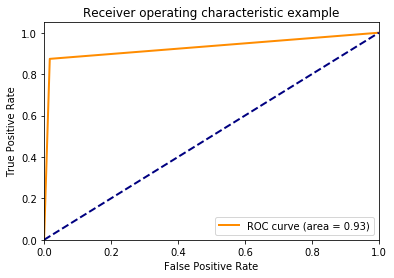

In [41]:
plt.figure()
lw = 2
plt.plot(fpr[2], tpr[2], color='darkorange',
         lw=lw, label='ROC curve (area = %0.2f)' % roc_auc[2])
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic example')
plt.legend(loc="lower right")
plt.show()

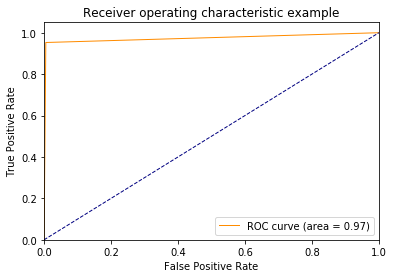

In [42]:
plt.figure()
lw = 1
plt.plot(fpr[1], tpr[1], color='darkorange',
         lw=lw, label='ROC curve (area = %0.2f)' % roc_auc[1])
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic example')
plt.legend(loc="lower right")
plt.show()

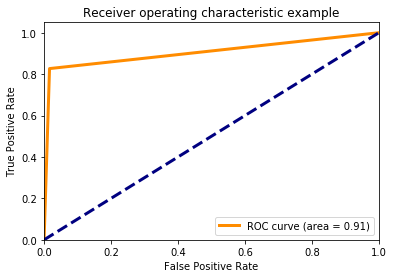

In [43]:
plt.figure()
lw = 3
plt.plot(fpr[3], tpr[3], color='darkorange',
         lw=lw, label='ROC curve (area = %0.2f)' % roc_auc[3])
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic example')
plt.legend(loc="lower right")
plt.show()

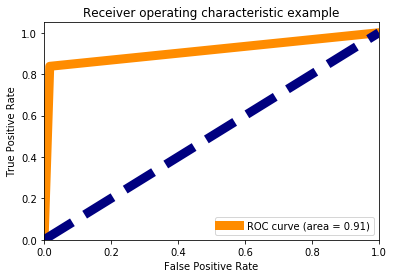

In [44]:
plt.figure()
lw = 9
plt.plot(fpr[9], tpr[9], color='darkorange',
         lw=lw, label='ROC curve (area = %0.2f)' % roc_auc[9])
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic example')
plt.legend(loc="lower right")
plt.show()

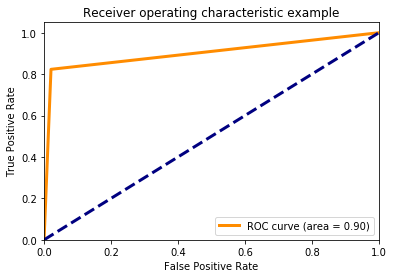

In [45]:
plt.figure()
lw = 3
plt.plot(fpr[8], tpr[8], color='darkorange',
         lw=lw, label='ROC curve (area = %0.2f)' % roc_auc[8])
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic example')
plt.legend(loc="lower right")
plt.show()

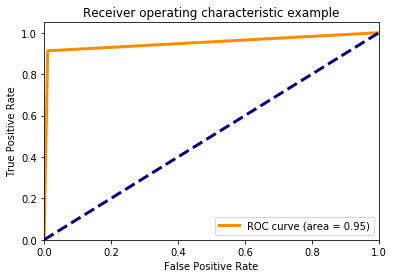

In [46]:
plt.figure()
lw = 3
plt.plot(fpr[7], tpr[7], color='darkorange',
         lw=lw, label='ROC curve (area = %0.2f)' % roc_auc[7])
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic example')
plt.legend(loc="lower right")
plt.show()

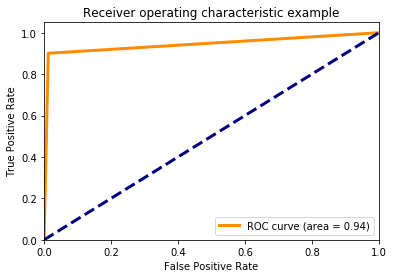

In [47]:
plt.figure()
lw = 3
plt.plot(fpr[6], tpr[6], color='darkorange',
         lw=lw, label='ROC curve (area = %0.2f)' % roc_auc[6])
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic example')
plt.legend(loc="lower right")
plt.show()

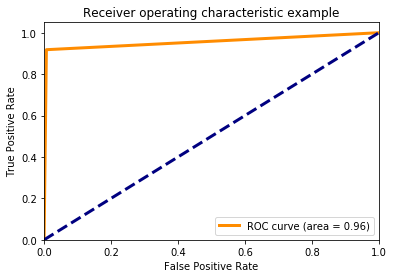

In [48]:
plt.figure()
lw = 3
plt.plot(fpr[0], tpr[0], color='darkorange',
         lw=lw, label='ROC curve (area = %0.2f)' % roc_auc[0])
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic example')
plt.legend(loc="lower right")
plt.show()

In [49]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler.fit(xtrain)
train_img = scaler.transform(xtrain)
test_img = scaler.transform(xtest)

/home/karthik/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:475: DataConversionWarning: Data with input dtype int64 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)


In [50]:
from sklearn.decomposition import PCA
pca = PCA(n_components=50)

In [51]:
pca.fit(train_img)

PCA(copy=True, iterated_power='auto', n_components=50, random_state=None,
  svd_solver='auto', tol=0.0, whiten=False)

In [52]:
train_img = pca.transform(train_img)
test_img = pca.transform(test_img)

In [53]:
dtreeclas = DecisionTreeClassifier()

In [54]:
train_img

array([[ 8.70903437e+00, -7.75426008e+00, -3.44763482e+00, ...,
         7.49221488e-01, -1.27770977e-01,  7.44428708e-01],
       [ 2.32823872e+00,  9.43074645e+00, -6.18430564e+00, ...,
        -1.31836925e+00,  5.02172358e+00,  4.96933910e+00],
       [-6.58214283e+00, -3.74657038e+00,  3.69095792e+00, ...,
        -1.02288181e-01, -1.02249640e-01,  4.25405903e-02],
       ...,
       [-3.77685315e+00, -3.23051493e+00, -3.80634413e+00, ...,
         1.62334263e+00, -6.95419476e-01,  2.23832757e+00],
       [ 1.72229905e+00, -4.94829634e+00,  7.14454011e-03, ...,
         4.49995515e-01,  1.72536522e+00,  2.57662017e+00],
       [-1.42720983e+00, -6.17571668e+00, -2.96754049e+00, ...,
        -1.90722220e-01,  9.53718678e-01,  8.50615423e-01]])

In [55]:
dtreeclas.fit(train_img,train_label)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')

In [56]:
pcaoutput = dtreeclas.predict(test_img)

In [57]:
pcaoutput

array([2, 1, 0, ..., 4, 8, 6])

In [58]:
countpca = 0
for i in range(0,9999):
    countpca+=1 if pcaoutput[i] == test_label[i] else 0

In [59]:
print(countpca)

8443


In [60]:
dtreeclas.score(test_img,test_label)

0.8443844384438444

### This is similar to Bagging of ensemble technique

In [61]:
c = 0
c1 = 0
for i in range(0,9999):
    c1=0
    if test_label[i] == pred[i]:
        c1+=1
    if test_label[i] == out[i]:
        c1+=1
    if test_label[i] == out1[i]:
        c1+=1
    if c1 >=2:
        c+=1
print("accuracy : ",c/9999*100)

accuracy :  91.49914991499149
